**Wavelet based**


In [ ]:
#libraries

import numpy as np
from scipy import ndimage
import torch
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

from PIL import Image

!pip install PyWavelets
#open-source library for wavelet transform https://github.com/PyWavelets/pywt
import pywt
import pywt.data

! pip install dtcwt
#open-source library for dual tree complex wavelet transform https://github.com/rjw57/dtcwt
import dtcwt
import dtcwt.compat
import dtcwt.sampling

from skimage.metrics import structural_similarity


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.8/70.8 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for dtcwt: filename=dtcwt-0.12.0-py3-none-any.whl size=87869 sha256=a115861748e567ad4a96fea1ce318a33b19599af736db22eabaa881aef8a80e0
  Stored in directory: /root/.cache/pip/wheels/af/50/50/cf98b0e08812889d0f5789d271acbdab7ac7c3086c323a8e0a
Successfully built dtcwt


Video Implementation


In [ ]:
#reading video

video_file = '/leaf.mp4'
#https://www.veed.io/videos

video = cv2.VideoCapture(video_file)

fps = video.get(cv2.CAP_PROP_FPS)

pos_frame = video.get(cv2.CAP_PROP_POS_FRAMES)

print(fps)
print(pos_frame)

25.0
0.0


True


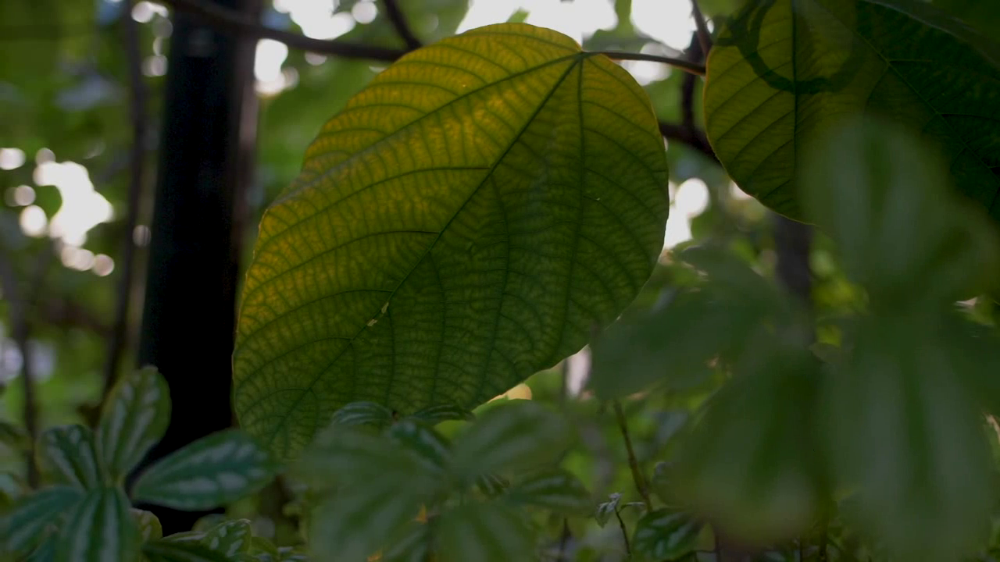

In [ ]:
video.set(cv2.CAP_PROP_POS_FRAMES, 5)
ret, frame = video.read()

print(ret)

cv2_imshow(frame)

In [ ]:
frame = cv2.imread("HR_VSR.jpg")

In [ ]:
frame = cv2.imread("/content/0882.png")

In [ ]:
ds_frame = cv2.imread("/content/0882x4.png")

In [ ]:
ds_frame = cv2.resize(frame, (0,0), fx=0.25, fy=0.25, interpolation = cv2.INTER_AREA)

In [ ]:
ds_frame = dtcwt.sampling.rescale(frame, (frame.shape[0]*0.5, frame.shape[1]*0.5), "lanczos")

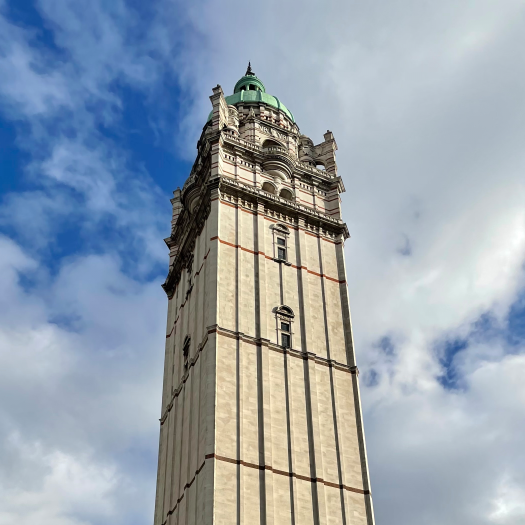

True

In [ ]:
cv2_imshow(ds_frame)
cv2.imwrite("ds_frame.jpg", ds_frame)

Direct wavelet transform

Wavelet zero padding


In [ ]:
# Load image
# Interpolate then inverse transform
original = ds_frame

# Inverse Wavelet transform
coeffs2 = pywt.dwt2(original[:,:,0], 'haar')
LL, (LH, HL, HH) = coeffs2
trans_result = np.empty((frame.shape[0], frame.shape[1], frame.shape[2]))

original_frame = cv2.resize(ds_frame, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

for i in range(3):
  LL = original_frame[:,:,i]
  LH = np.zeros(LL.shape)
  HL = np.zeros(LL.shape)
  HH = np.zeros(LL.shape)
  coeffs2 = LL*1.999999999999, (LH, HL, HH)
  #inverse wavelet transform
  trans_result[:,:,i]=pywt.idwt2(coeffs2,"haar")

In [ ]:
# do it twice
# Interpolate then inverse transform
original = ds_frame

# Inverse Wavelet transform
coeffs2 = pywt.dwt2(original[:,:,0], 'bior4.4')
LL, (LH, HL, HH) = coeffs2
#trans_result = np.empty((ds_frame.shape[0]*2, ds_frame.shape[1]*2, frame.shape[2]))
trans_result = np.empty((670, 1012, frame.shape[2]))

for i in range(3):
  LL = original[:,:,i]
  LH = np.zeros(LL.shape)
  HL = np.zeros(LL.shape)
  HH = np.zeros(LL.shape)
  coeffs2 = LL*1.999999999999, (LH, HL, HH)
  #inverse wavelet transform
  trans_result[:,:,i]=pywt.idwt2(coeffs2,"bior4.4")

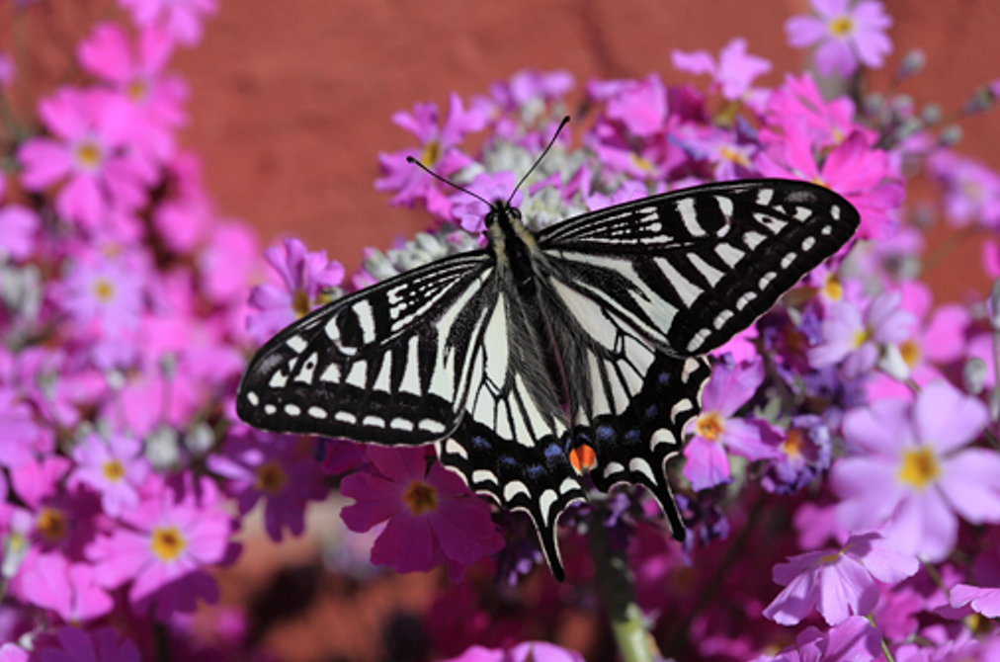

In [ ]:
cv2_imshow(trans_result)

In [ ]:
# do it twice
# Interpolate then inverse transform
original = trans_result

# Inverse Wavelet transform
coeffs2 = pywt.dwt2(original[:,:,0], 'bior4.4')
LL, (LH, HL, HH) = coeffs2
#trans_result = np.empty((ds_frame.shape[0]*2, ds_frame.shape[1]*2, frame.shape[2]))
trans_result2 = np.empty((1332, 2016, frame.shape[2]))

for i in range(3):
  LL = original[:,:,i]
  LH = np.zeros(LL.shape)
  HL = np.zeros(LL.shape)
  HH = np.zeros(LL.shape)
  coeffs2 = LL*1.999999999999, (LH, HL, HH)
  #inverse wavelet transform
  trans_result2[:,:,i]=pywt.idwt2(coeffs2,"bior4.4")

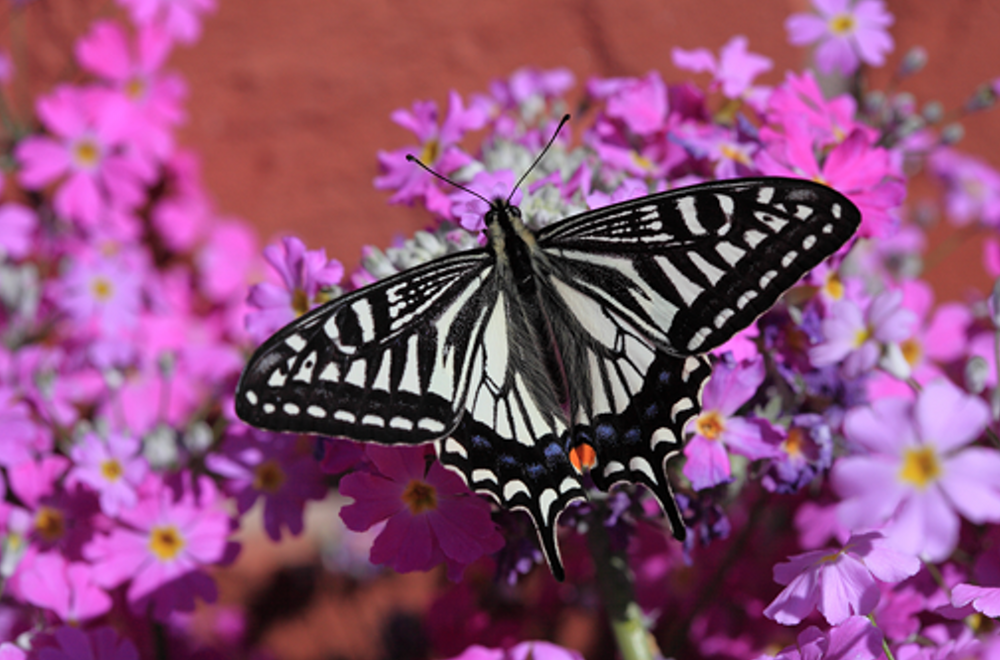

In [ ]:
cv2_imshow(trans_result2)

In [ ]:
width = 2016
height = 1332
dim = (width, height)
frame_compare = cv2.resize(trans_result2, dim)

In [ ]:
# do it twice


# Inverse Wavelet transform
coeffs2 = pywt.dwt2(trans_result[:,:,0], 'haar')
LL, (LH, HL, HH) = coeffs2
trans_result2 = np.empty((frame.shape[0], frame.shape[1], frame.shape[2]))

for i in range(3):
  LL = trans_result[:,:,i]
  LH = np.zeros(LL.shape)
  HL = np.zeros(LL.shape)
  HH = np.zeros(LL.shape)
  coeffs2 = LL*1.999999999999, (LH, HL, HH)
  #inverse wavelet transform
  trans_result2[:,:,i]=pywt.idwt2(coeffs2,"haar")

In [ ]:
cv2.imwrite("WZP_db4.png", trans_result2)

True

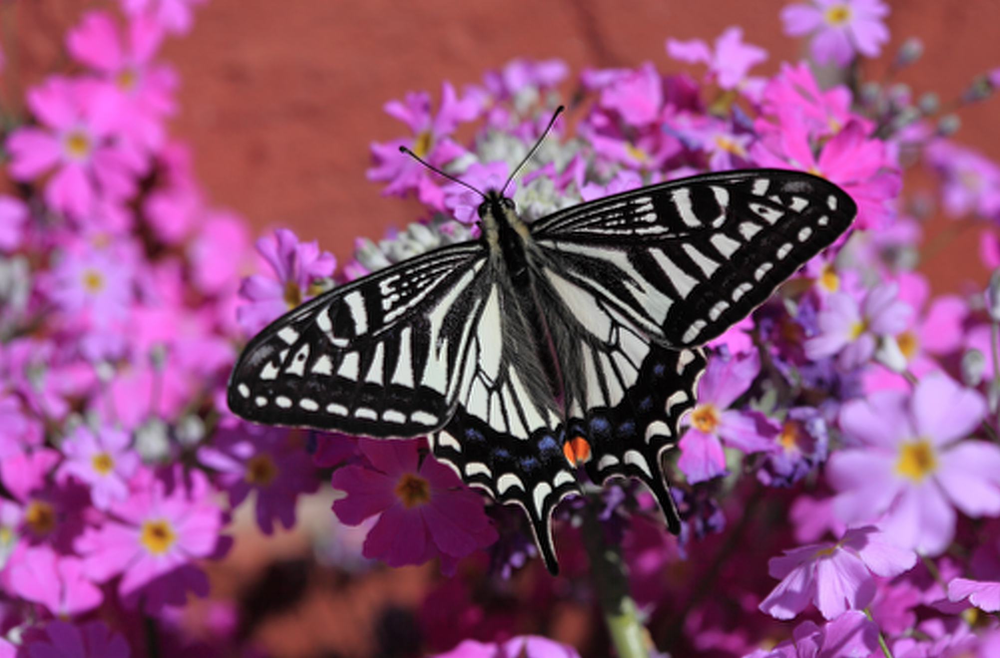

In [ ]:
cv2_imshow(frame_compare)

In [ ]:
def psnr(image1, image2):

    # OpenCV
    print('OpenCV PSNR: ', cv2.PSNR(image1, image2))

    # Own implementation
    mse = np.mean((image1.astype(np.float64) / 255 - image2.astype(np.float64) / 255) ** 2)
    print('Own implementation: ', 10 * np.log10(1. / mse))


def luma(image):
    return (0.299 * image[:, :, 2] + 0.587 * image[:, :, 1] + 0.114 * image[:, :, 0]).astype(np.uint8)
    # return (0.2126 * image[:, :, 2] + 0.7152 * image[:, :, 1] + 0.0722 * image[:, :, 0]).astype(np.uint8)
    # return (0.212 * image[:, :, 2] + 0.701 * image[:, :, 1] + 0.087 * image[:, :, 0]).astype(np.uint8)


# Calculate PSNR on referenced images
img1 = frame.astype('float32')
img2 = trans_result2.astype('float32')

#img1 = interpolated_frame.astype('float32')
#img2 = frame.astype('float32')
psnr(img1, img2)

# Calculate luma PSNR on referenced images
psnr(luma(img1), luma(img2))

error: ignored

In [ ]:
def psnr(image1, image2):

    # OpenCV
    print('OpenCV PSNR: ', cv2.PSNR(image1, image2))

    # Own implementation
    mse = np.mean((image1.astype(np.float64) / 255 - image2.astype(np.float64) / 255) ** 2)
    print('Own implementation: ', 10 * np.log10(1. / mse))


def luma(image):
    return (0.299 * image[:, :, 2] + 0.587 * image[:, :, 1] + 0.114 * image[:, :, 0]).astype(np.uint8)
    # return (0.2126 * image[:, :, 2] + 0.7152 * image[:, :, 1] + 0.0722 * image[:, :, 0]).astype(np.uint8)
    # return (0.212 * image[:, :, 2] + 0.701 * image[:, :, 1] + 0.087 * image[:, :, 0]).astype(np.uint8)


# Calculate PSNR on referenced images
img1 = frame_compare.astype('float32')
img2 = trans_result2.astype('float32')

#img1 = interpolated_frame.astype('float32')
#img2 = frame.astype('float32')
psnr(img1, img2)

# Calculate luma PSNR on referenced images
psnr(luma(img1), luma(img2))

OpenCV PSNR:  361.20199909921956
Own implementation:  inf
OpenCV PSNR:  361.20199909921956
Own implementation:  inf


<ipython-input-75-f39d618317c8>:8: RuntimeWarning: divide by zero encountered in double_scalars
  print('Own implementation: ', 10 * np.log10(1. / mse))


In [ ]:
# SSIM
from skimage.metrics import structural_similarity

before = frame.astype('float32')
after = trans_result2.astype('float32')

# Convert images to grayscale
before_gray = cv2.cvtColor(before, cv2.COLOR_BGR2GRAY)
after_gray = cv2.cvtColor(after, cv2.COLOR_BGR2GRAY)

# Compute SSIM between two images
score = structural_similarity(before, after, multichannel=True, gaussian_weights=True, sigma=1.5, use_sample_covariance=False, data_range=255)
#(score, diff) = structural_similarity(before_gray, after_gray, full=True)
print("Image similarity", score)

<ipython-input-77-f23b6ec8231c>:12: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  score = structural_similarity(before, after, multichannel=True, gaussian_weights=True, sigma=1.5, use_sample_covariance=False, data_range=255)


ValueError: ignored

In [ ]:
# SSIM
from skimage.metrics import structural_similarity

before = frame_compare.astype('float32')
after = trans_result2.astype('float32')

# Convert images to grayscale
before_gray = cv2.cvtColor(before, cv2.COLOR_BGR2GRAY)
after_gray = cv2.cvtColor(after, cv2.COLOR_BGR2GRAY)

# Compute SSIM between two images
score = structural_similarity(before, after, multichannel=True, gaussian_weights=True, sigma=1.5, use_sample_covariance=False, data_range=255)
#(score, diff) = structural_similarity(before_gray, after_gray, full=True)
print("Image similarity", score)

<ipython-input-78-d9621289bb50>:12: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  score = structural_similarity(before, after, multichannel=True, gaussian_weights=True, sigma=1.5, use_sample_covariance=False, data_range=255)


Image similarity 1.0


In [ ]:
cv2.imwrite("WZP.png", trans_result2)

True

DWT With SWT

In [ ]:
original_frame = frame[0:1352][:][:]

In [ ]:
np.shape(ds_frame)

(339, 510, 3)

In [ ]:
original = cv2.resize(original_frame, None, fx=0.25, fy=0.25, interpolation=cv2.INTER_AREA)

In [ ]:
# Load image

original = ds_frame[0:338][:][:]

# Discrete Wavelet transform
trans_result = np.empty((original.shape[0]*4, original.shape[1]*4, original.shape[2]))

original_interpolated = cv2.resize(original, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
for i in range(3):
  coeffs2 = pywt.dwt2(original[:,:,i], 'haar')
  LL, (LH, HL, HH) = coeffs2

  LH = cv2.resize(LH, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
  HL = cv2.resize(HL, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
  HH = cv2.resize(HH, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
  LL = original_interpolated[:,:,i]

 # Stationary Wavelet transform of image, and plot approximation and details
  arr = original[:,:,i]

  level = 0
  titles = ['Approximation', ' Horizontal detail',
              'Vertical detail', 'Diagonal detail']
  for LLs, (LHs, HLs, HHs) in pywt.swt2(arr, 'haar', level=1, start_level=0):
      #fig = plt.figure()
      #for m, a in enumerate([LL, LH, HL, HH]):
          #plt.Axes.imshow(a, origin='upper', interpolation="bicubic", cmap=plt.cm.gray)
          #plt.Axes.set_title(titles[i], fontsize=12)

      #plt.fig.suptitle("SWT2 coefficients, level %s" % level, fontsize=14)
      level += 1

  LHs = LHs + LH
  HLs = HLs + HL
  HHs = HHs + HH

  LHs = cv2.resize(LHs, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
  HLs = cv2.resize(HLs, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
  HHs = cv2.resize(HHs, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

  coeffs2= LL*1.99999999, (LHs, HLs, HHs)
  #inverse wavelet transform
  trans_result[:,:,i]=pywt.idwt2(coeffs2,"haar")


In [ ]:
# bior4.4
# Load image

original = ds_frame[0:338][:][:]

# Discrete Wavelet transform
trans_result = np.empty((original.shape[0]*4, original.shape[1]*4, original.shape[2]))

trans_result = np.empty((1344, 2032, original.shape[2]))

original_interpolated = cv2.resize(original, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
for i in range(3):
  coeffs2 = pywt.dwt2(original[:,:,i], 'bior4.4')
  LL, (LH, HL, HH) = coeffs2

  LH = cv2.resize(LH, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
  HL = cv2.resize(HL, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
  HH = cv2.resize(HH, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
  LL = original_interpolated[:,:,i]

  width = 510
  height = 338
  dim = (width, height)
  LH = cv2.resize(LH, dim)
  HL = cv2.resize(HL, dim)
  HH = cv2.resize(HH, dim)

 # Stationary Wavelet transform of image, and plot approximation and details
  arr = original[:,:,i]

  level = 0
  titles = ['Approximation', ' Horizontal detail',
              'Vertical detail', 'Diagonal detail']
  for LLs, (LHs, HLs, HHs) in pywt.swt2(arr, 'bior4.4', level=1, start_level=0):
      #fig = plt.figure()
      #for m, a in enumerate([LL, LH, HL, HH]):
          #plt.Axes.imshow(a, origin='upper', interpolation="bicubic", cmap=plt.cm.gray)
          #plt.Axes.set_title(titles[i], fontsize=12)

      #plt.fig.suptitle("SWT2 coefficients, level %s" % level, fontsize=14)
      level += 1


  LHs = LHs + LH
  HLs = HLs + HL
  HHs = HHs + HH

  LHs = cv2.resize(LHs, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
  HLs = cv2.resize(HLs, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
  HHs = cv2.resize(HHs, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)

  coeffs2= LL*1.99999999, (LHs, HLs, HHs)
  #inverse wavelet transform
  trans_result[:,:,i]=pywt.idwt2(coeffs2,"bior4.4")


<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [ ]:
np.shape(ds_frame)

(339, 510, 3)

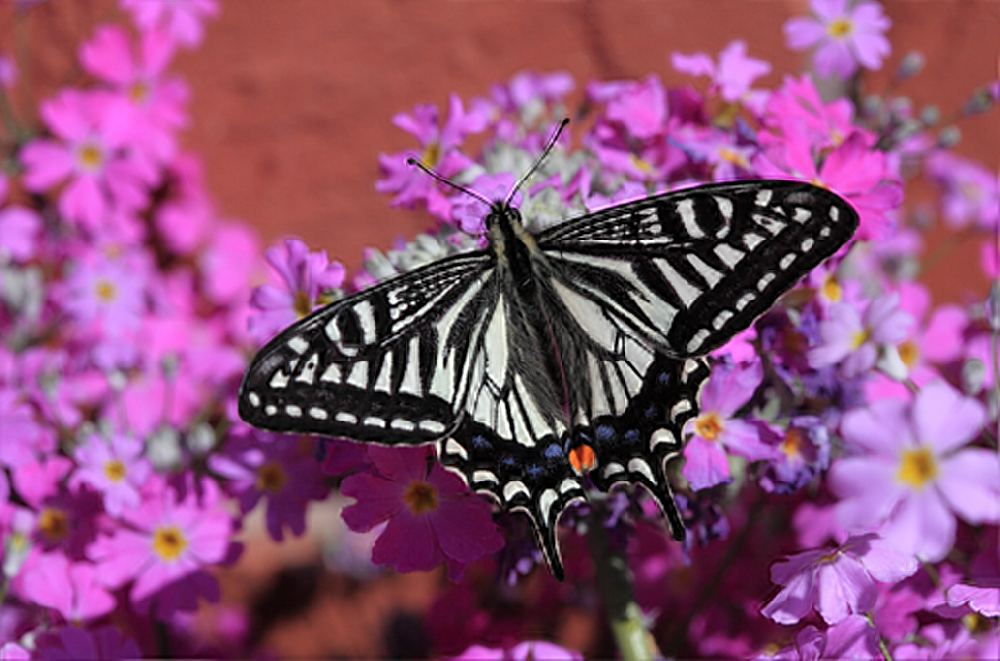

(1344, 2032, 3)

In [ ]:
cv2_imshow(trans_result)
trans_result.shape
#image more gray for no reason? because of using original as LL?

In [ ]:
cv2.imwrite("DWTSWT.png", trans_result)

True

In [ ]:
cv2.imwrite("DWTSWT_bior4.4.png", trans_result)

True

In [ ]:
original_frame = frame[0:1352][:][:]

In [ ]:
def psnr(image1, image2):

    # OpenCV
    print('OpenCV PSNR: ', cv2.PSNR(image1, image2))

    # Own implementation
    mse = np.mean((image1.astype(np.float64) / 255 - image2.astype(np.float64) / 255) ** 2)
    print('Own implementation: ', 10 * np.log10(1. / mse))


def luma(image):
    return (0.299 * image[:, :, 2] + 0.587 * image[:, :, 1] + 0.114 * image[:, :, 0]).astype(np.uint8)
    # return (0.2126 * image[:, :, 2] + 0.7152 * image[:, :, 1] + 0.0722 * image[:, :, 0]).astype(np.uint8)
    # return (0.212 * image[:, :, 2] + 0.701 * image[:, :, 1] + 0.087 * image[:, :, 0]).astype(np.uint8)


# Calculate PSNR on referenced images
img1 = original_frame.astype('float32')
img2 = trans_result.astype('float32')

#img1 = interpolated_frame.astype('float32')
#img2 = frame.astype('float32')
psnr(img1, img2)

# Calculate luma PSNR on referenced images
psnr(luma(img1), luma(img2))

error: ignored

In [ ]:
# SSIM
from skimage.metrics import structural_similarity

before = original_frame.astype('float32')
after = trans_result.astype('float32')

# Convert images to grayscale
before_gray = cv2.cvtColor(before, cv2.COLOR_BGR2GRAY)
after_gray = cv2.cvtColor(after, cv2.COLOR_BGR2GRAY)

# Compute SSIM between two images
score = structural_similarity(before, after, multichannel=True, gaussian_weights=True, sigma=1.5, use_sample_covariance=False, data_range=255)
#(score, diff) = structural_similarity(before_gray, after_gray, full=True)
print("Image similarity", score)

<ipython-input-328-a4836e7a0a58>:12: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  score = structural_similarity(before, after, multichannel=True, gaussian_weights=True, sigma=1.5, use_sample_covariance=False, data_range=255)


Image similarity 0.57067615


DWT with NEDI

In [ ]:
#edi.py from open source repo https://github.com/Kirstihly/Edge-Directed_Interpolation/blob/master/edi.py
import cv2
import numpy as np
from matplotlib import pyplot as plt
import math
import sys

"""
Author:

    hu.leying@columbia.edu

Usage:

    EDI_predict(img, m, s)

    # img is the input image
    # m is the sampling window size, not scaling factor! The larger the m, more blurry the image. Ideal m >= 4.
    # s is the scaling factor, support any s > 0 (e.g. use s=2 to upscale by 2, use s=0.5 to downscale by 2)

If you want to directly call EDI_upscale to upscale image by the scale of 2:

    EDI_upscale(img, m)

    # m should be the power of 2. Will increment by 1 if input m is odd

If you want to directly call EDI_downscale to downscale image by the scale of 2:

    EDI_downscale(img)

"""

def EDI_downscale(img):

    # initializing downgraded image
    w, h = img.shape
    imgo2 = np.zeros((w//2, h//2))

    # downgrading image
    for i in range(w//2):
        for j in range(h//2):
            imgo2[i][j] = int(img[2*i][2*j])

    return imgo2.astype(img.dtype)

def EDI_upscale(img, m):

    # m should be equal to a power of 2
    if m%2 != 0:
        m += 1

    # initializing image to be predicted
    w, h = img.shape
    imgo = np.zeros((w*2,h*2))

    # Place low-resolution pixels
    for i in range(w):
        for j in range(h):
            imgo[2*i][2*j] = img[i][j]

    y = np.zeros((m**2,1)) # pixels in the window
    C = np.zeros((m**2,4)) # interpolation neighbours of each pixel in the window

    # Reconstruct the points with the form of (2*i+1,2*j+1)
    for i in range(math.floor(m/2), w-math.floor(m/2)):
        for j in range(math.floor(m/2), h-math.floor(m/2)):
            tmp = 0
            for ii in range(i-math.floor(m/2), i+math.floor(m/2)):
                for jj in range(j-math.floor(m/2), j+math.floor(m/2)):
                    y[tmp][0] = imgo[2*ii][2*jj]
                    C[tmp][0] = imgo[2*ii-2][2*jj-2]
                    C[tmp][1] = imgo[2*ii+2][2*jj-2]
                    C[tmp][2] = imgo[2*ii+2][2*jj+2]
                    C[tmp][3] = imgo[2*ii-2][2*jj+2]
                    tmp += 1

            # calculating weights
            # a = (C^T * C)^(-1) * (C^T * y) = (C^T * C) \ (C^T * y)
            a = np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(C),C)), np.transpose(C)), y)
            imgo[2*i+1][2*j+1] = np.matmul([imgo[2*i][2*j], imgo[2*i+2][2*j], imgo[2*i+2][2*j+2], imgo[2*i][2*j+2]], a)

    # Reconstructed the points with the forms of (2*i+1,2*j) and (2*i,2*j+1)
    for i in range(math.floor(m/2), w-math.floor(m/2)):
        for j in range(math.floor(m/2), h-math.floor(m/2)):
            tmp = 0
            for ii in range(i-math.floor(m/2), i+math.floor(m/2)):
                for jj in range(j-math.floor(m/2), j+math.floor(m/2)):
                    y[tmp][0] = imgo[2*ii+1][2*jj-1]
                    C[tmp][0] = imgo[2*ii-1][2*jj-1]
                    C[tmp][1] = imgo[2*ii+1][2*jj-3]
                    C[tmp][2] = imgo[2*ii+3][2*jj-1]
                    C[tmp][3] = imgo[2*ii+1][2*jj+1]
                    tmp += 1

            # calculating weights
            # a = (C^T * C)^(-1) * (C^T * y) = (C^T * C) \ (C^T * y)
            a = np.matmul(np.matmul(np.linalg.pinv(np.matmul(np.transpose(C),C)), np.transpose(C)), y)
            imgo[2*i+1][2*j] = np.matmul([imgo[2*i][2*j], imgo[2*i+1][2*j-1], imgo[2*i+2][2*j], imgo[2*i+1][2*j+1]], a)
            imgo[2*i][2*j+1] = np.matmul([imgo[2*i-1][2*j+1], imgo[2*i][2*j], imgo[2*i+1][2*j+1], imgo[2*i][2*j+2]], a)

    # Fill the rest with bilinear interpolation
    np.clip(imgo, 0, 255.0, out=imgo)
    imgo_bilinear = cv2.resize(img, dsize=(h*2,w*2), interpolation=cv2.INTER_LINEAR)
    imgo[imgo==0] = imgo_bilinear[imgo==0]

    return imgo.astype(img.dtype)

def EDI_predict(img, m, s):

    try:
        w, h = img.shape
    except:
        sys.exit("Error input: Please input a valid grayscale image!")

    output_type = img.dtype

    if s <= 0:
        sys.exit("Error input: Please input s > 0!")

    elif s == 1:
        print("No need to rescale since s = 1")
        return img

    elif s < 1:
        # Calculate how many times to do the EDI downscaling
        n = math.floor(math.log(1/s, 2))

        # Downscale to the expected size with linear interpolation
        linear_factor = 1/s / math.pow(2, n)
        if linear_factor != 1:
            img = cv2.resize(img, dsize=(int(h/linear_factor),int(w/linear_factor)), interpolation=cv2.INTER_LINEAR).astype(output_type)

        for i in range(n):
            img = EDI_downscale(img)
        return img

    elif s < 2:
        # Linear Interpolation is enough for upscaling not over 2
        return cv2.resize(img, dsize=(int(h*s),int(w*s)), interpolation=cv2.INTER_LINEAR).astype(output_type)

    else:
        # Calculate how many times to do the EDI upscaling
        n = math.floor(math.log(s, 2))
        for i in range(n):
            img = EDI_upscale(img, m)

        # Upscale to the expected size with linear interpolation
        linear_factor = s / math.pow(2, n)
        if linear_factor == 1:
            return img.astype(output_type)

        # Update new shape
        w, h = img.shape
        return cv2.resize(img, dsize=(int(h*linear_factor),int(w*linear_factor)), interpolation=cv2.INTER_LINEAR).astype(output_type)


In [ ]:
np.shape(ds_frame)

(339, 510, 3)

In [ ]:
# Load image
# download edi.py from https://github.com/Kirstihly/Edge-Directed_Interpolation
original = ds_frame[0:338][:][:]
original2x = cv2.resize(original, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
trans_result = np.zeros([np.shape(original)[0]*4, np.shape(original)[1]*4, np.shape(original)[2]])

for i in range (3):
  original_enlarge = EDI_predict(original[:,:,i], 4, 4)

  # Wavelet transform of image, and plot approximation and details

  coeffs = pywt.dwt2(original_enlarge, 'haar')
  LL, (LH, HL, HH) = coeffs

  #white halo around the edges

  #the result *2 fix the issue of greyness

  #why not original *2 though
  #original *1.9999 fix the issue also, some values got clipped and reset from 0

  #coeffs = original[:,:,i]*1.9999, (LH, HL, HH)
  coeffs = original2x[:,:,i]*1.9999999, (LH, HL, HH)
  #inverse wavelet transform
  trans_result[:,:,i]=pywt.idwt2(coeffs,"haar")
  #cv2_imshow(trans_result)
  #trans_result.shape
  #white halo around the edges

#the result *2 fix the issue of greynes
#why not original *2 though
#original *1.9999 fix the issue also, some values got clipped and reset from 0
#original *1.9999 have softer textures and edges compared to trans_result*2 version

In [ ]:
# Load image
original = ds_frame[0:338][:][:]
width = 1024
height = 680
dim = (width, height)
original2x = cv2.resize(original, dim, interpolation=cv2.INTER_CUBIC)
trans_result = np.zeros([np.shape(original)[0]*4, np.shape(original)[1]*4, np.shape(original)[2]])

for i in range (3):
  original_enlarge = EDI_predict(original[:,:,i], 4, 4)

  # Wavelet transform of image, and plot approximation and details

  coeffs = pywt.dwt2(original_enlarge, 'bior4.4')
  LL, (LH, HL, HH) = coeffs

  print(np.shape(LH))
  print(np.shape(LL))
  #white halo around the edges

  #the result *2 fix the issue of greyness

  #why not original *2 though
  #original *1.9999 fix the issue also, some values got clipped and reset from 0

  #coeffs = original[:,:,i]*1.9999, (LH, HL, HH)
  coeffs = original2x[:,:,i]*1.9999999, (LH, HL, HH)
  #inverse wavelet transform

  print(np.shape(pywt.idwt2(coeffs,"bior4.4")))
  trans_result[:,:,i]=pywt.idwt2(coeffs,"bior4.4")
  #cv2_imshow(trans_result)
  #trans_result.shape
  #white halo around the edges

#the result *2 fix the issue of greynes
#why not original *2 though
#original *1.9999 fix the issue also, some values got clipped and reset from 0
#original *1.9999 have softer textures and edges compared to trans_result*2 version

(680, 1024)
(680, 1024)
(1352, 2040)
(680, 1024)
(680, 1024)
(1352, 2040)
(680, 1024)
(680, 1024)
(1352, 2040)


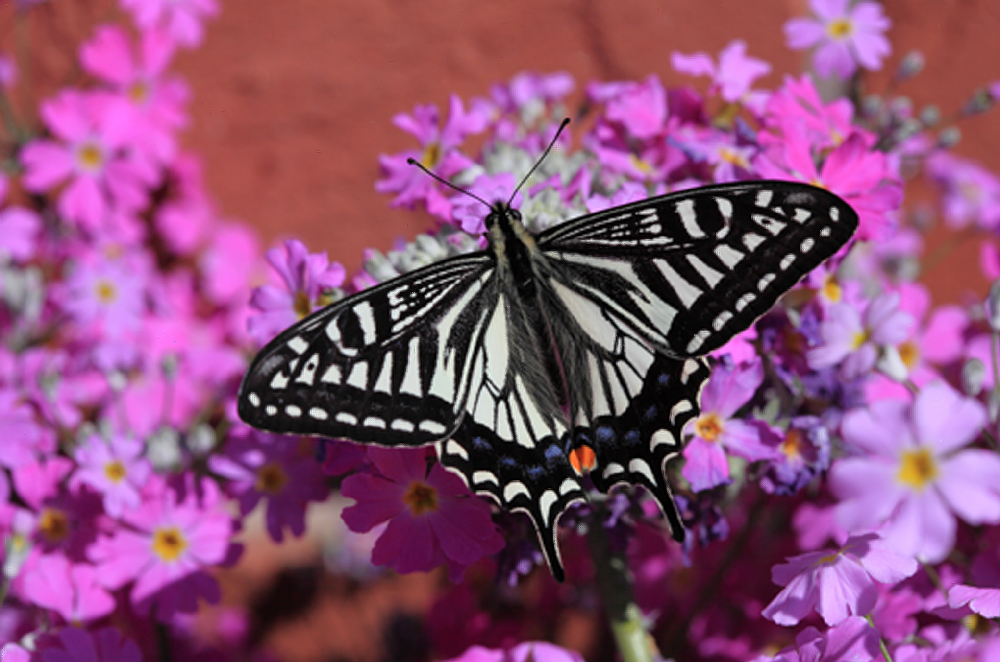

In [ ]:
cv2_imshow(trans_result)

In [ ]:
cv2.imwrite("DWTNEDI_bior4.4.png", trans_result)

True

In [ ]:
def psnr(image1, image2):

    # OpenCV
    print('OpenCV PSNR: ', cv2.PSNR(image1, image2))

    # Own implementation
    mse = np.mean((image1.astype(np.float64) / 255 - image2.astype(np.float64) / 255) ** 2)
    print('Own implementation: ', 10 * np.log10(1. / mse))


def luma(image):
    return (0.299 * image[:, :, 2] + 0.587 * image[:, :, 1] + 0.114 * image[:, :, 0]).astype(np.uint8)
    # return (0.2126 * image[:, :, 2] + 0.7152 * image[:, :, 1] + 0.0722 * image[:, :, 0]).astype(np.uint8)
    # return (0.212 * image[:, :, 2] + 0.701 * image[:, :, 1] + 0.087 * image[:, :, 0]).astype(np.uint8)


# Calculate PSNR on referenced images
img1 = frame[0:1352,:,:].astype('float32')
img2 = trans_result.astype('float32')

#img1 = interpolated_frame.astype('float32')
#img2 = frame.astype('float32')
psnr(img1, img2)

# Calculate luma PSNR on referenced images
psnr(luma(img1), luma(img2))

OpenCV PSNR:  26.144029884070896
Own implementation:  26.144029884076474
OpenCV PSNR:  24.83524681013998
Own implementation:  24.835246810139978


In [ ]:
# SSIM
from skimage.metrics import structural_similarity

before = frame[0:1352,:,:].astype('float32')
after = trans_result.astype('float32')

# Convert images to grayscale
before_gray = cv2.cvtColor(before, cv2.COLOR_BGR2GRAY)
after_gray = cv2.cvtColor(after, cv2.COLOR_BGR2GRAY)

# Compute SSIM between two images
score = structural_similarity(before, after, multichannel=True, gaussian_weights=True, sigma=1.5, use_sample_covariance=False, data_range=255)
#(score, diff) = structural_similarity(before_gray, after_gray, full=True)
print("Image similarity", score)

<ipython-input-134-796e3c4f7519>:12: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  score = structural_similarity(before, after, multichannel=True, gaussian_weights=True, sigma=1.5, use_sample_covariance=False, data_range=255)


Image similarity 0.8732967
